# Hierarchical Clustering

Hierarchical clustering is an approach that produces a set of nested clusters organized as a hierarchical tree. It works very well with nested or hierarchical structures of the data, moreover it's flexible, becouse you don't have to choose a priori a fixed number of clusters. On the other hand the time and space performance are not the best, and sometimes the algorithms are too much sensitive to noise and otliers.<br>
(It's also used to determine the number of clusters before starting k-means.) <-- *vediamo se mettere questa frase, non l'abbiamo fatto*
<br><br>
Agglomerative clustering works using a proximity matrix, which shows the distance between each cluster. At each iteration the clusters with smallest distance are merged until only one cluster remains. The distance between each group is calculated using different policies, we will explain later the ones we choose for our analisys.

In [22]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics.pairwise import euclidean_distances
from scipy.cluster.hierarchy import linkage, cophenet, cut_tree
from clustering_utils import *
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_score, silhouette_samples
import seaborn as sns
import utm

We start importing the dataset of the indicators we want to use to cluster incidents

In [2]:
incidents_df = pd.read_csv('../data/indicators.csv', index_col=False)
incidents_df.drop("Unnamed: 0", axis=1, inplace=True)

In [3]:
incidents_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239381 entries, 0 to 239380
Data columns (total 19 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   lat_proj                   226585 non-null  float64
 1   lon_proj                   226585 non-null  float64
 2   location_imp               226585 non-null  float64
 3   surprisal_address_type     204054 non-null  float64
 4   age_range                  144855 non-null  float64
 5   avg_age                    144855 non-null  float64
 6   surprisal_min_age          138954 non-null  float64
 7   n_child_prop               197948 non-null  float64
 8   n_teen_prop                197948 non-null  float64
 9   surprisal_age_groups       172004 non-null  float64
 10  n_killed_prop              214751 non-null  float64
 11  n_injured_prop             214751 non-null  float64
 12  n_unharmed_prop            211988 non-null  float64
 13  n_males_prop               19

## Dataset preparation
We get the original dataset to get complete info on each incident

In [4]:
incidents_df_full = pd.read_csv('../data/incidents_cleaned.csv')
incidents_df_full.head(2)

,date,date_original,year,month,day,day_of_week,state,address,latitude,longitude,...,defensive,workplace,abduction,unintentional,poverty_perc,party,candidate_votes,total_votes,candidate_perc,population_state_2010
0,2015-05-02,2015-05-02,2015.0,5,2,5,INDIANA,Lafayette Road and Pike Plaza,39.8322,-86.2492,...,False,False,False,False,12.3,DEMOCRAT,61443.0,112261.0,54.732276,6483802
1,2017-04-03,2017-04-03,2017.0,4,3,0,PENNSYLVANIA,5647 US 6,41.6645,-78.7856,...,False,False,False,False,10.5,REPUBLICAN,206761.0,307843.0,67.164431,12702379


We restrict once again our analisys to the state with most records

In [5]:
# select a subset of records regarding a certain state
incidents_df['state'] = incidents_df_full['state']

state = "ILLINOIS"
incidents_df = incidents_df[incidents_df['state'] == state]
incidents_df.drop('state', axis=1, inplace=True)

We delete latitude and longitude columns becouse, from previous experiments, we saw that they affect too much the clustering. In fact, in different algorithms, they result to be a criteria "too much weighted", leading in cluster subdivision based almost just on their distribution

In [6]:
incidents_df.drop(columns=['lat_proj', 'lon_proj'], axis=1, inplace=True)

In [7]:
incidents_df.isna().sum()

location_imp                  770
surprisal_address_type       1395
age_range                    3365
avg_age                      3365
surprisal_min_age            4006
n_child_prop                 1827
n_teen_prop                  1827
surprisal_age_groups         2978
n_killed_prop                1136
n_injured_prop               1136
n_unharmed_prop              1313
n_males_prop                 1726
surprisal_n_males            2972
surprisal_characteristics    1324
n_arrested_prop              1313
n_participants               1136
surprisal_day                1324
dtype: int64

We drop all columns with NaN, otherwise we can't perform clustering. Since they're not too much, this action doesn't affect the analisys.

In [8]:
incidents_df.dropna(inplace=True)

incidents_df.shape

(13231, 17)

We scale all the data in order to avoid that the attributes with higher values affect too much the clustering. What can happen, in fact, is that if an attribute has bigger numbers in the range if its possible values, the overall distance between each points will be moslty affected by the difference calculated for that particular attribute. By doing scaling we restrict our values between 0 and 1, avoiding the domincance of one or a small group of features.

In [9]:
scaler_obj = MinMaxScaler()
incidents_df = pd.DataFrame(data=scaler_obj.fit_transform(incidents_df.values), columns=incidents_df.columns, index=incidents_df.index)

In [10]:
# print all indexes for clustering
incidents_df.columns

Index(['location_imp', 'surprisal_address_type', 'age_range', 'avg_age',
       'surprisal_min_age', 'n_child_prop', 'n_teen_prop',
       'surprisal_age_groups', 'n_killed_prop', 'n_injured_prop',
       'n_unharmed_prop', 'n_males_prop', 'surprisal_n_males',
       'surprisal_characteristics', 'n_arrested_prop', 'n_participants',
       'surprisal_day'],
      dtype='object')

## Clustering

There are different types of algorithms we can choose to perform hierrchical clustering, and they differ for the type of linkage they perform. We choose 4 algorithms: *single linkage*, *complete linkage*, *average linkage* and *ward*. Here we give a short description of them, pointing out theire strengths and weaknesses.
- **single linkage**: the proximity of two clusters corrisponds to the distance to the nearest point in each cluster. This performs good when we want to capture cluster with non-elliptical shapes, but at the same time we lose robustness to noise and outliers.
- **complete linkage**: the proximity of two clusters corrisponds to the distance to the furthest point in each cluster. The advantage here is that the algorithm is not susceptible to noise and outliers, but this strategy tends to be biased towards globular clusters. Moreover it doesn't work well when we have one or more clusters bigger than the others, since it may happen that it breaks them in different parts. 
- **average linkage**: it combines the last two algorithms, in fact here the the proximity of two clusters corrisponds to the the average of the distance of all points in both clusters. It still remains robust to noise and outliers, but it's also biased towards globular clusters.
- **ward**: it's the hierarchical analogue of k-means, the similarity of two clusters is based on the increase in squared error when two clusters are merged. Like average linkage is robust to noise and outliers but it's biased towards globular clusters.


In [11]:
# clustering
algorithms = ["single", "complete", "average", "ward"]
linkages = []
distance_thresholds = []

for algorithm in algorithms:
    #models.append(AgglomerativeClustering(linkage=algorithm, compute_distances=True).fit(incidents_df))
    linkage_res = linkage(pdist(incidents_df, metric='euclidean'), method=algorithm, metric='euclidean', optimal_ordering=False)

    linkages.append(linkage_res)
    distance_thresholds.append(0.7 * max(linkage_res[:,2])) # the first threshold we use is the default

We define a function that plots dendrograms corresponding to a certain linkage. Each cluster is displayed in different colors (the choice of cluster separation is given by a certain threshold)

In [12]:
import sys
sys.setrecursionlimit(10000)

def plot_dendrograms(linkages, algorithms, thresholds):
    f, axs = plt.subplots(ncols=len(linkages), figsize=(32,7))

    for i in range(len(linkages)):
        axs[i].set_title(algorithms[i])
        axs[i].set_xlabel('IncidentID or (Cluster Size)')
        axs[i].set_ylabel('Distance')
        axs[i].axhline(thresholds[i], ls='--', color='k', label='threshold')
        color_threshold = thresholds[i]

        # Plot the corresponding dendrogram
        dendrogram(linkages[i], truncate_mode="lastp", p=30, leaf_rotation=60, leaf_font_size=8,
                show_contracted=True, ax=axs[i], color_threshold=color_threshold)

    plt.suptitle(('Hierarchical Clustering Dendograms'), fontsize=18, fontweight='bold')
    plt.show()

We check the results of clustering looking at the dendrograms. In the first analisys we set the threshold to its default value.

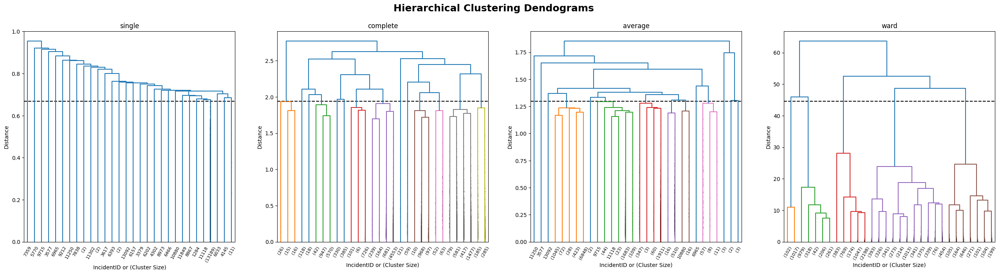

In [13]:
plot_dendrograms(linkages, algorithms, distance_thresholds)

From these dendrograms we see that each linkage lead to very different shaped hierarchies.<br>
The **single-linkage** tends to add each point to a huge cluster that contains (almost) all the other points already chosen for merging. The result we get is similar to what we could archieve aligning some points with increasing distance to the previous in a straight line.<br>
The **complete-linkage**, instead, we can observe a more balanced tree. We can see from the number between parenthesis (below in the graph) that there is one cluster significantly higher than others, but the result we have it's not the one we get from single-linkage where everything is absorbed by the same one.<br>
In **average-linkage** we find, as expected, a compromise between single and complete linkage. In fact, we see that there is a cluster that tend to absorb all the other points, but not in the same way we see in single-linkage. Compared to the first one, as we can see, the tree is more balanced.<br>
In **ward** we find the most balanced results, both in terms of tree structure and in terms of clusters size.

Here we try to find the **best cut**, we iterate until a certain point and we find the optimal number of clusters for each linkage. We compare the different cuts we have looking at the **average silhouette score**, assigning to the best cut the one which maximize this measure.
<br><br>
The **silhouette score** is a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation). It's in range [-1, 1] and we want to maximize it, but with a clustering that actually make sense and give us some extra info on our data.

In [14]:
ncuts = 10 # valutare se aumentarli, possiamo ottenere migliori prestazioni su complete
clusters_info_df = pd.DataFrame([],  columns =  ['method', 'threshold', 'distance_diff', 'cluster_labels', 'n_clusters', 'clusters_sizes'])
silhouette_scores = []
for i, algorithm in enumerate(algorithms):
    merge_dist = linkages[i][:,2]
    merge_dist_diff = np.array([merge_dist[j + 1] - merge_dist[j] for j in range(len(merge_dist) - 1)])
    sorted_merge_dist_diff_it = np.argsort(-merge_dist_diff)

    best_threshold = 0
    best_distance_diff = 0
    best_labels = []
    best_n_clusters = 0
    best_cluster_sizes = []
    best_silhouette_score = 0
    for j in range(ncuts):
        clusters = np.array(cut_tree(linkages[i], height=merge_dist[sorted_merge_dist_diff_it[j]] + np.finfo(float).eps)).reshape(-1)
        n_clusters = np.unique(clusters).shape[0]
        # check silhouette score
        if(n_clusters > 1):
            silhouette_avg = silhouette_score(incidents_df, clusters)
            if silhouette_avg > best_silhouette_score:
                best_threshold = merge_dist[sorted_merge_dist_diff_it[j]]
                best_distance_diff = merge_dist_diff[sorted_merge_dist_diff_it[j]]
                best_labels = clusters
                best_n_clusters = n_clusters
                counts = np.bincount(clusters) # TODO: serve per centroid e medoid che assegnano come label id non contigui
                best_cluster_sizes = counts[counts!=0]
                best_silhouette_score = silhouette_avg
    
    clusters_info_df.loc[len(clusters_info_df)] = [algorithm, best_threshold, best_distance_diff, best_labels, best_n_clusters, best_cluster_sizes]
    silhouette_scores.append(best_silhouette_score)

We plot the results of our search.

In [15]:
clusters_info_df

,method,threshold,distance_diff,cluster_labels,n_clusters,clusters_sizes
0,single,0.921333,0.032300,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",2,"[13230, 1]"
1,complete,1.964664,0.066376,"[0, 1, 0, 0, 2, 3, 0, 4, 5, 2, 5, 2, 3, 0, 2, ...",13,"[5637, 833, 2554, 1559, 118, 1075, 18, 715, 47..."
2,average,1.746068,0.105975,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",2,"[13223, 8]"
3,ward,24.664687,3.480157,"[0, 1, 2, 0, 0, 3, 2, 4, 5, 0, 5, 0, 3, 0, 0, ...",7,"[4145, 915, 4188, 1806, 675, 1119, 383]"


The **Cophenetic correlation coefficient**  is a measure of how faithfully a dendrogram preserves the pairwise distances between the original unmodeled data points. It's calculated looking at the distancences beetween each points in the clusters and in the original dataset and their mean.

In [19]:
dm = pdist(incidents_df)
cophenetic_coefs = []
for linkage in linkages:
    cophenetic_matrix = cophenet(linkage)
    cophenetic_coef = np.corrcoef(cophenetic_matrix, dm)[0][1]
    cophenetic_coefs.append(cophenetic_coef)


results_df = pd.DataFrame()
results_df['method'] = clusters_info_df['method']
results_df['optimal n_clusters'] = clusters_info_df['n_clusters']
results_df['distance threshold'] = clusters_info_df['threshold']
results_df['silhouette score'] = silhouette_scores
results_df['cophenetic correlation coefficient'] = cophenetic_coefs
results_df.set_index(['method'], inplace=True)
results_df

,optimal n_clusters,distance threshold,silhouette score,cophenetic correlation coefficient
method,,,,
single,2,0.921333,0.346382,0.789850
complete,13,1.964664,0.319234,0.720990
average,2,1.746068,0.362897,0.832911
ward,7,24.664687,0.368106,0.699254


In [24]:
pd.DataFrame(silhouette_samples(incidents_df, clusters_info_df.loc[3]['cluster_labels'], metric='euclidean'), index=incidents_df.index)

,0
19,-0.025665
21,0.565453
67,0.692355
117,0.163527
121,0.311333
...,...
239305,0.628032
239306,0.043274
239310,0.149211
239321,0.544380


We plot the silhouette scores for each point to visualize the distribution of the score values for each cluster of the algorithms.

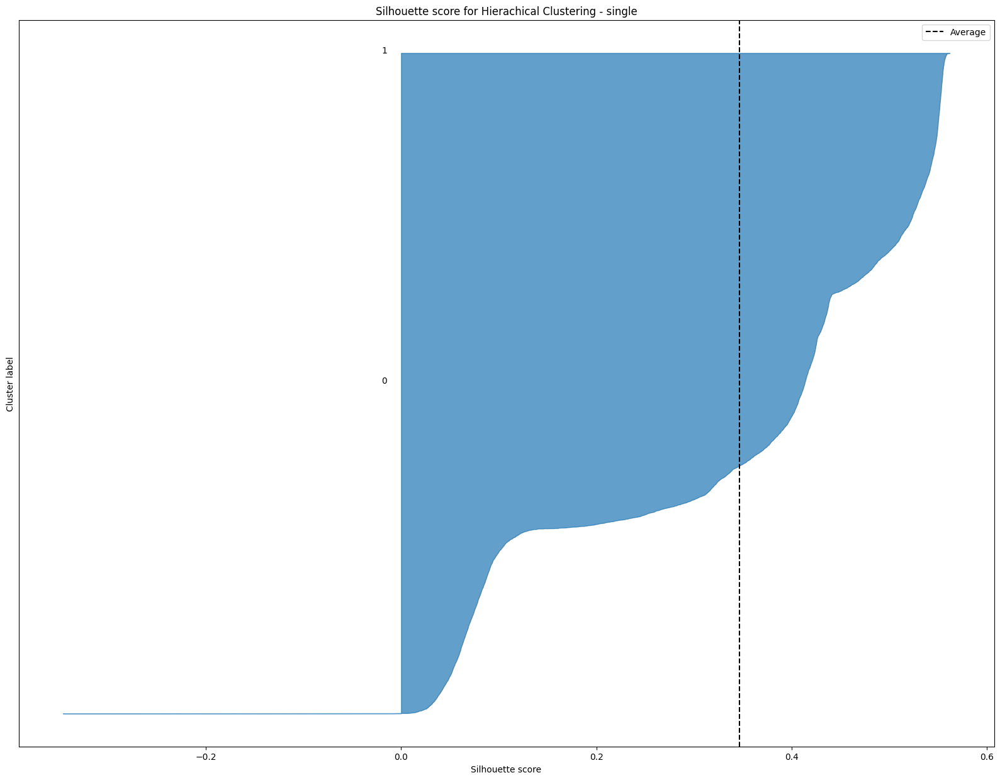

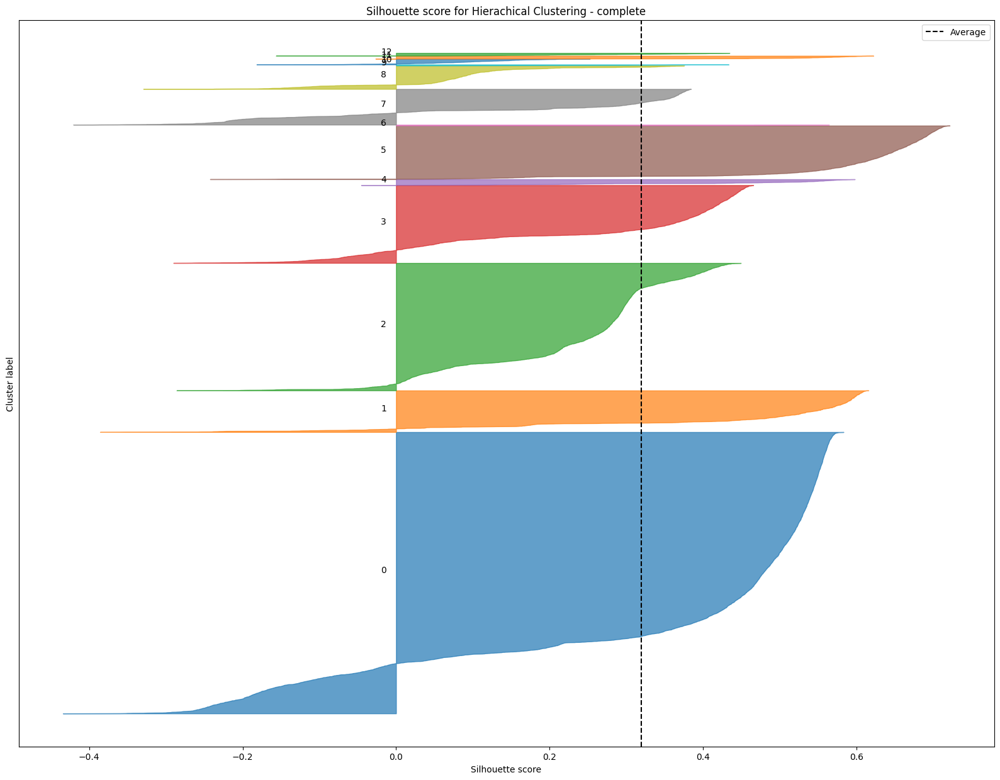

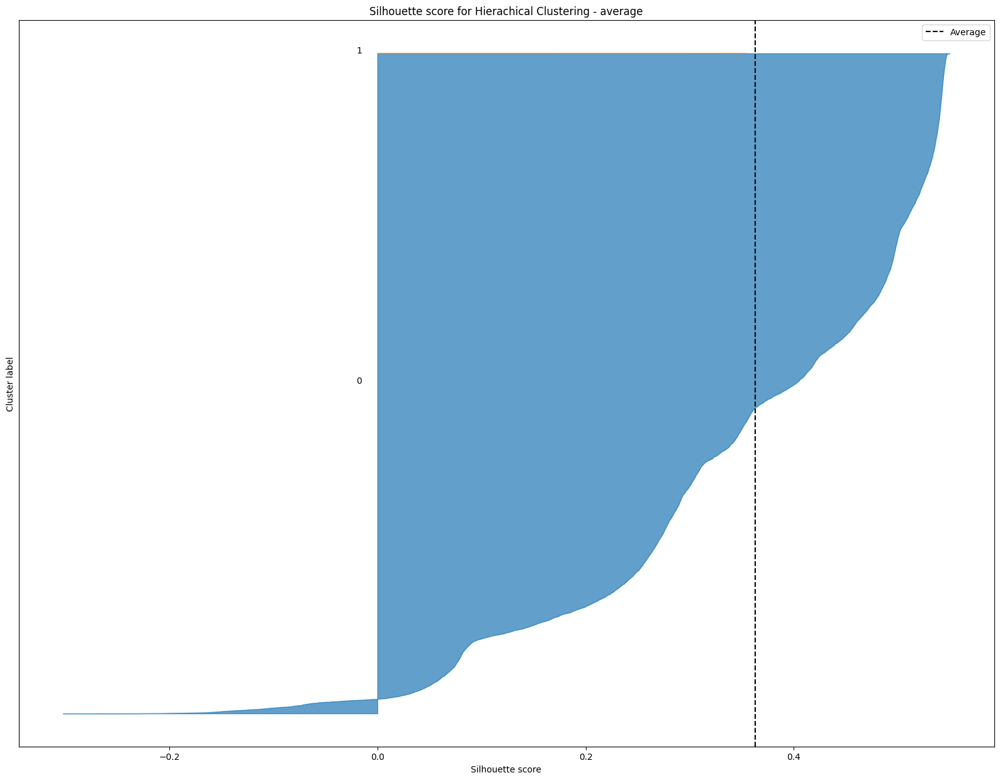

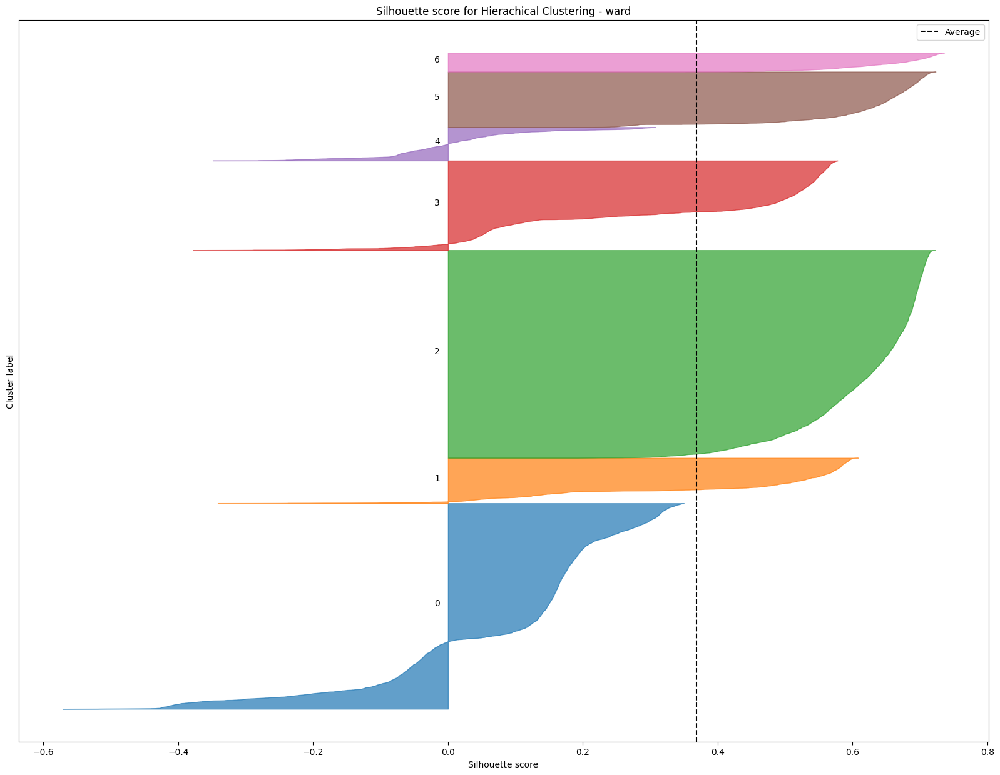

In [79]:
for i in range(len(algorithms)):
    fig, axs = plt.subplots(1, figsize=(20,15))
    silhouette_per_point = silhouette_samples(X=incidents_df, labels=clusters_info_df.loc[i]['cluster_labels'])
    plot_scores_per_point(
        score_per_point=silhouette_per_point,
        clusters=clusters_info_df.loc[i]['cluster_labels'],
        score_name='Silhouette score',
        ax=axs,
        title=('Silhouette score for Hierachical Clustering - ' + algorithms[i]),
        color_palette=sns.color_palette(n_colors=clusters_info_df.loc[i]['n_clusters']),
        minx=-0.02
    )

For single and average we see that the main cluster is esemplificative of the situation of the entire data. In complete we see that almost every cluster have some points which are below 0, and the distributions are quite similar. In ward clusters 6, 5 and 2 which don't have any negative points with negative silhouette score, the average value is taken down by cluster 0.

We create 2 csv files which respectively contains the labels of the ward algorithm and the associated average silhouette score.

In [42]:
labels_df = pd.DataFrame(clusters_info_df.loc[3]['cluster_labels'], index=incidents_df.index, columns=['cluster'])

folderpath = "../data/clustering_labels/"
labels_df.to_csv(folderpath + "hierarchical.csv")

In [37]:
silhouette_df_avg = pd.DataFrame([results_df.loc['ward']['silhouette score']], index=[0], columns=['silhouette_score'])
silhouette_df_avg.to_csv(folderpath + "hierarchical_internal_scores.csv")


We create a csv file with some internal scores, useful to compare different clustering algorithms.

In [52]:
internal_scores_df = pd.DataFrame(columns=['hierarchical'])
metrics = ['BBS', 'SSE', 'calinski_harabasz_score', 'davies_bouldin_score', 'model', 'n_iter', 'silhouette_score']

for metric in metrics:
    if(metric == 'silhouette_score'):
        internal_scores_df.loc[metric] = results_df.loc['ward']['silhouette score']
    else:
        internal_scores_df.loc[metric] = pd.NA

internal_scores_df.to_csv(folderpath + "hierarchical_internal_scores.csv")

C:\Users\lucam\AppData\Local\Temp\ipykernel_19776\1398352483.py:6: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



We create a csv file with some external scores, useful to compare different clustering algorithms.

In [118]:
incidents_df_external = incidents_df_full[incidents_df_full.index.isin(incidents_df.index)]
incidents_df_external['cluster'] = clusters_info_df.loc[3]['cluster_labels']

incidents_df_external['unharmed'] = incidents_df_full['n_unharmed'] > 0
incidents_df_external['arrested'] = incidents_df_full['n_arrested'] > 0
incidents_df_external['males'] = incidents_df_full['n_males'] > 0
incidents_df_external['females'] = incidents_df_full['n_females'] > 0

external_scores_df = compute_permutation_invariant_external_metrics(
    incidents_df_external,
    'cluster',
    ['shots', 'aggression', 'suicide', 'injuries', 'death', 'drugs', 'illegal_holding', 'unharmed', 'arrested','males', 'females']
)

external_scores_df.to_csv(folderpath + "hierarchical_external_scores.csv")

C:\Users\lucam\AppData\Local\Temp\ipykernel_19776\75942201.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lucam\AppData\Local\Temp\ipykernel_19776\75942201.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lucam\AppData\Local\Temp\ipykernel_19776\75942201.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

Here we plot the same dendrograms but applying the threshold we found.

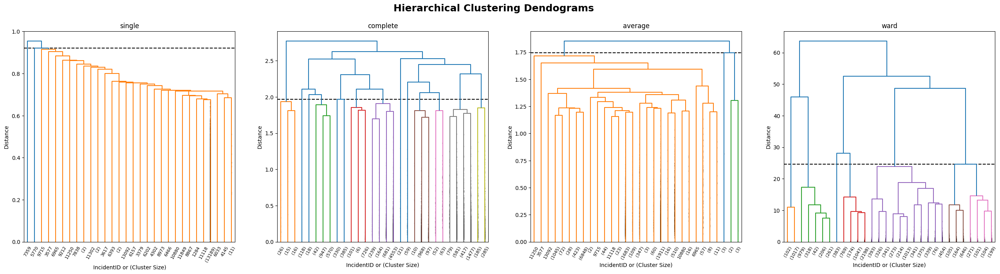

In [53]:
plot_dendrograms(linkages, algorithms, list(results_df['distance threshold']))

# Clustering evaluation

We evaluate the results we get using different plots that enligth different aspects of our analisys.

At first we plot the **proximity** and **ideal similarity matrices** to find out if the points in the same clusters are close to each other, in this way we inspect correlation between the points.<br>
We plot only the matrices corresponding to complete linkage and ward, since the other two have only two cluster where the second one is very small (singletone in case of single-link).<br>
We also compute the **Pearson's coefficient** to check how good is the correlation. It's calculated as the ratio between the covariance of two variables and the product of their standard deviations.

(array([[0.        , 1.11660198, 1.06779053, ..., 1.49461551, 1.54380201,
         1.5129555 ],
        [1.11660198, 0.        , 0.48429118, ..., 1.29281751, 1.27579296,
         1.30263857],
        [1.06779053, 0.48429118, 0.        , ..., 1.36387146, 1.39752277,
         1.33693204],
        ...,
        [1.49461551, 1.29281751, 1.36387146, ..., 0.        , 0.23975542,
         0.3274579 ],
        [1.54380201, 1.27579296, 1.39752277, ..., 0.23975542, 0.        ,
         0.39557714],
        [1.5129555 , 1.30263857, 1.33693204, ..., 0.3274579 , 0.39557714,
         0.        ]]),
 array([[0., 0., 0., ..., 1., 1., 1.],
        [0., 0., 0., ..., 1., 1., 1.],
        [0., 0., 0., ..., 1., 1., 1.],
        ...,
        [1., 1., 1., ..., 0., 0., 0.],
        [1., 1., 1., ..., 0., 0., 0.],
        [1., 1., 1., ..., 0., 0., 0.]]))

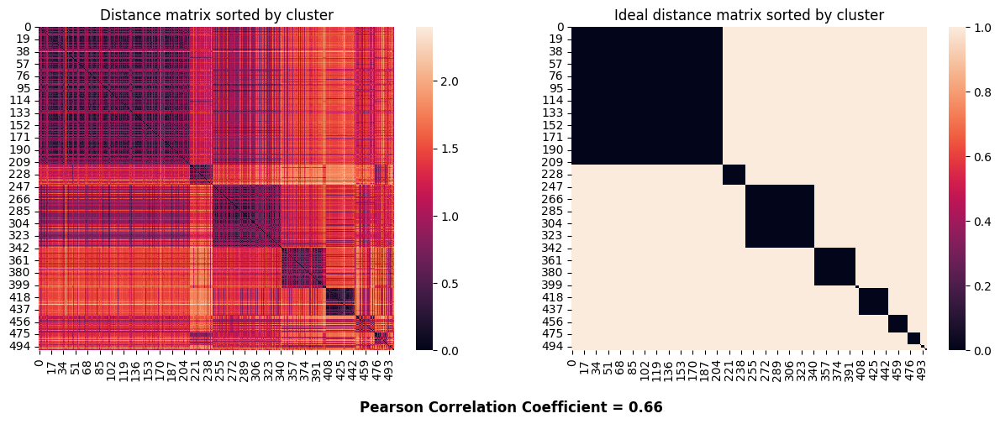

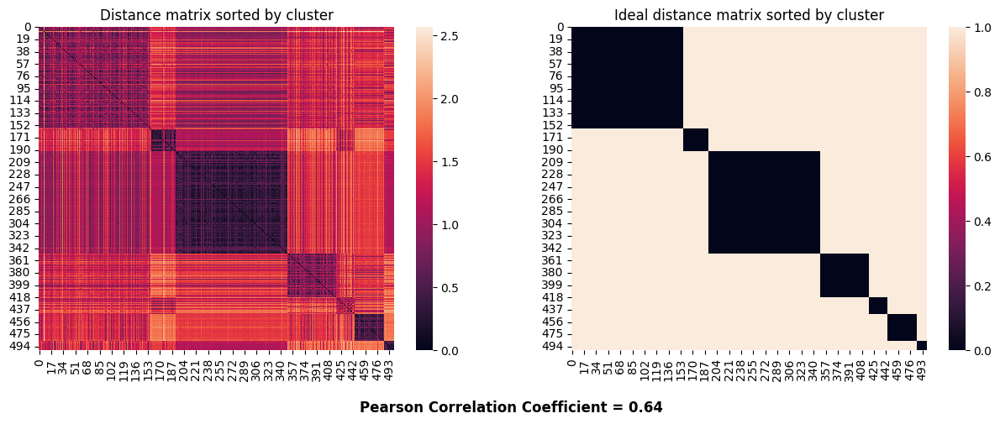

In [54]:
# correlation matrix
RANDOM_STATE = 42
X = incidents_df.values

# display only complete and ward
plot_distance_matrices(X=X, n_samples=500, clusters=clusters_info_df.loc[1]['cluster_labels'], random_state=RANDOM_STATE)
plot_distance_matrices(X=X, n_samples=500, clusters=clusters_info_df.loc[3]['cluster_labels'], random_state=RANDOM_STATE)

We can see for both algorithms that there is an evdent correlation between points in the same cluster, in particular in ward algorithm which hasn't tiny cluster as complete. Moreover, we can se that there are at least 4 clusters in ward with very low distance between all the the internal points.

Here we plot, in a histogram, the size of each cluster for all the linkage methods we used.

C:\Users\lucam\AppData\Local\Temp\ipykernel_19776\3365986582.py:4: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



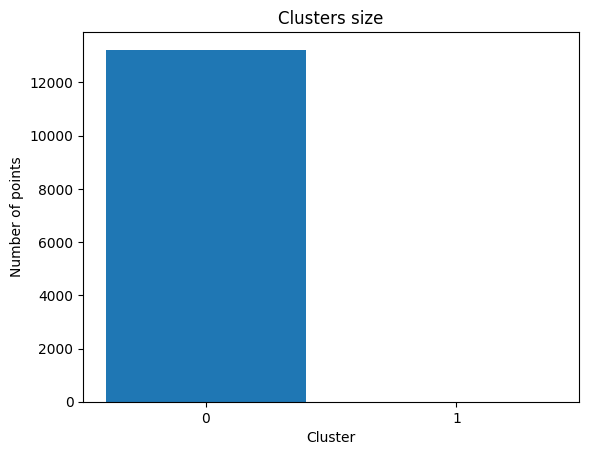

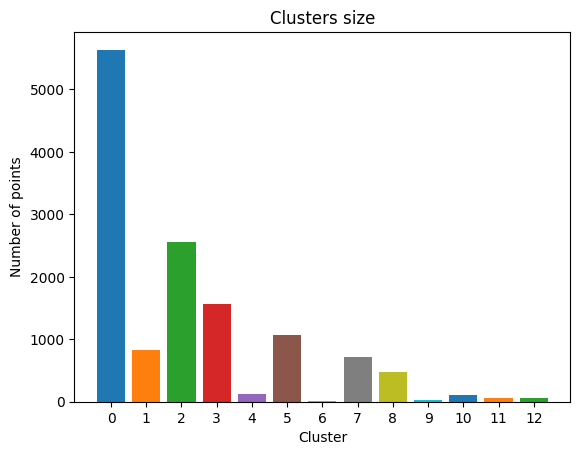

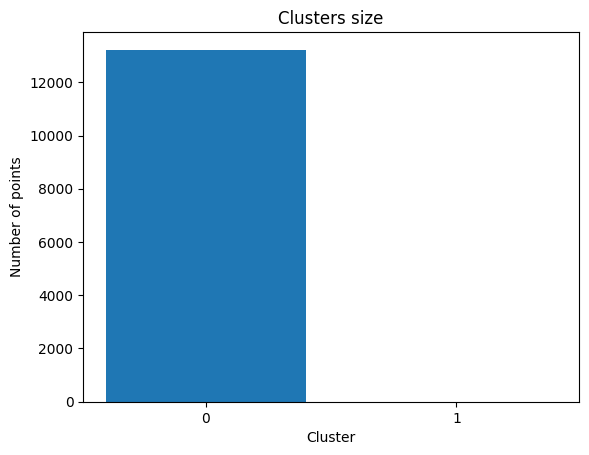

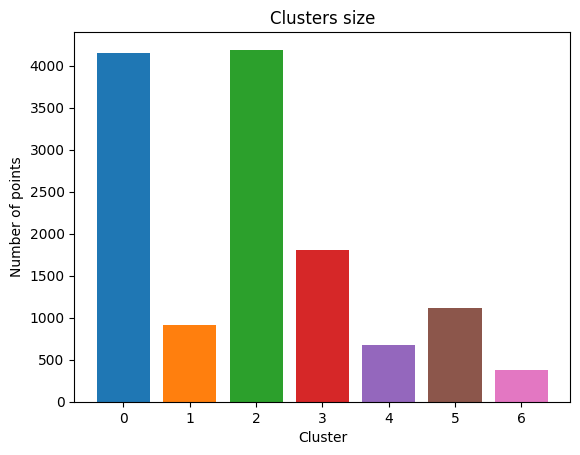

In [55]:
for i in range(len(algorithms)):
    fig, axs = plt.subplots(1)
    plot_clusters_size(clusters_info_df.loc[i]['cluster_labels'], ax=axs, title='Clusters size')
    fig.show()

We plot the distance between the merged clusters. Here we can also visualize at wich heigth the standard threshold and the best cut threshold we found separate the clusters.

Text(0.5, 0.98, 'Distance between merged clusters')

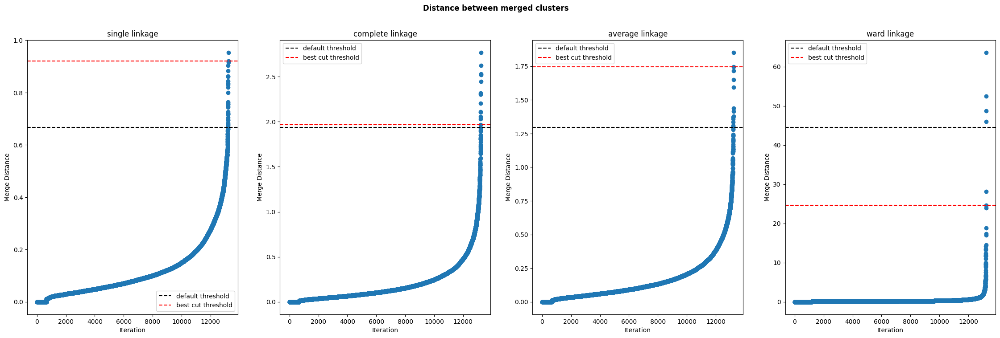

In [56]:
start_iteration = 1
fig, axs = plt.subplots(ncols=4, figsize=(28, 8))
for i, algorithm in enumerate(algorithms):
    axs[i].plot(range(start_iteration, linkages[i].shape[0]), linkages[i][start_iteration:, 2], 'o')
    axs[i].axhline(distance_thresholds[i], ls='--', color='k', label='default threshold')
    axs[i].axhline(results_df.loc[algorithms[i]]['distance threshold'], ls='--', color='r', label='best cut threshold')
    axs[i].legend()
    axs[i].set_title(f'{algorithm} linkage')
    axs[i].set_xlabel('Iteration')
    axs[i].set_ylabel('Merge Distance')
fig.suptitle('Distance between merged clusters', fontweight='bold')

From now on we restrict our analisys only to one cluster algorithm. We choose **ward** becouse it has the best silhouette score and it distributes moro homougeneously the data points among all the clusters.

Here we display a **scatter plot** of all the features used for clustering combined two by two. We use these plots to understand better what are the criteria of separation and wich spaces of the data are included in each cluster.

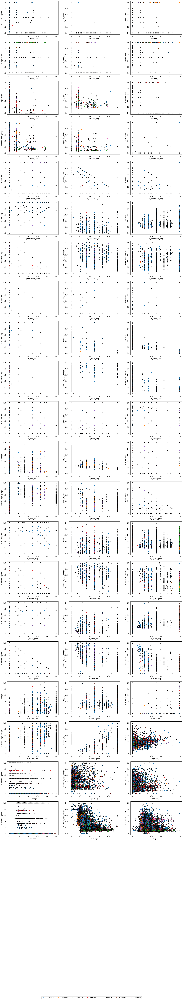

In [83]:
cluster_column_name = algorithms
incidents_df_cluster = incidents_df.copy()

# we create a dataframe where we can easily retrieve the label of the clustering for each incident
for i in range(len(algorithms)):
    incidents_df_cluster[algorithms[i]] = clusters_info_df.loc[i]['cluster_labels']

# we plot taking in consideration only the features wich are
# significative for clustering separation
features = ['location_imp', 'n_unharmed_prop', 'n_child_prop', 'n_teen_prop', 'n_injured_prop', 'n_killed_prop', 'n_males_prop',
            'age_range', 'avg_age', 'n_arrested_prop', 'surprisal_age_groups', 'surprisal_n_males']
scatter_by_cluster(incidents_df_cluster,
                   #incidents_df.columns,
                   features,
                   algorithms[3],
                   figsize=(20, 100),
                   color_palette=sns.color_palette(n_colors=clusters_info_df.loc[3]['n_clusters']))

Here we tell, for each cluster, which are the distinguishing attributes and their associated values:<br>

cluster 0: **n_unharmed_prop** > 0 with **location_imp** = 0 & **location_imp** = 0 with all possible values of **n_child_prop**, but in general **n_child_prop** > 0.2 & the majority of the points in  0.2 < **n_injured_prop** < 0.8 & **age_range** <  0.2 & **n_arrested_prop** = 0.2

cluster 1: some points **avg_age** = 0.2 & **surprisal_age_groups** < 0.3 with **n_injured_prop** = 1. Since it has a small size, it's difficoult to find dominant patterns in the dataset for this cluster

cluster 2: **surprisal age_groups** = 0.1 & **n_injured_prop** = 1

cluster 3: **n_arrested_prop** > 0.5

cluster 4: a big part of the points in **avg_age** = 0.2 & **surprisal_age_groups** > 0.3 & **n_teen_prop** > 0.3 with **n_child_prop** = 0

cluster 5: **n_killed_prop** = 1

cluster 6: **surprisal_n_males** = 0.5 & **n_males_prop** = 0

We display, for each feature, a **boxplot** and a **violin plot** in order to check the distribution of the data and get some statistical insights for that feature in a specific cluster.

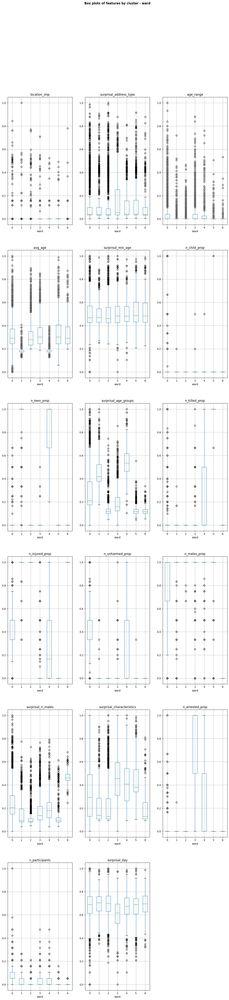

In [86]:
plot_boxes_by_cluster(incidents_df_cluster,
                    incidents_df.columns,
                    algorithms[3],
                    figsize=(15, 65),
                    title=('Box plots of features by cluster - ward'))

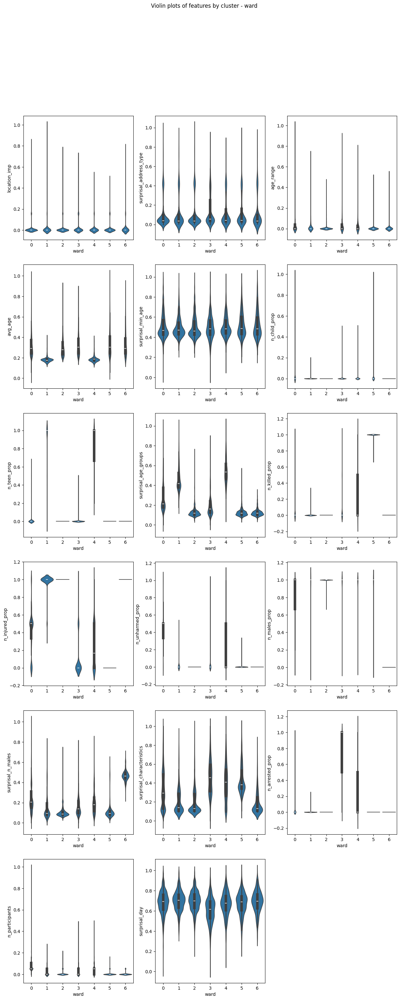

In [87]:
plot_violin_by_cluster(
    incidents_df_cluster,
    incidents_df.columns,
    algorithms[3],
    figsize=(15, 35),
    title=('Violin plots of features by cluster - ward')
)

For each feature we can see the following behaviour:

- location_importance: distributions are grouped around 0 and points arer mainly classified as outlier by boxplot.

- surprisal_address_type: we have similar distributions, points are a little bit more accumulated around the median in **clusters 0** and **2**. There are plenty of outliers.

- age range: all distributions have mostly points near 0 and lots of outliers. In **clusters 0**, **3** and **4** points are less concentrated around the median.

- avg age: we have mostly wide distributions around 0.3, and some more compact one with median slightly below 0.2 (**clusters 1** and **4**).

- surprisal_min_age: points are equally distributed through the clusters and there are a lot of outliers.

- n_child prop: same as *location_imp*.

- n_teen_prop: we have just points classifed as outliers except for **cluster 4**.

- surprisal_age_groups: we have different distributions with different median values and plenty of outliers. All distributions with low median accumulate points around it.

- n_killed_prop: most of the points are outliers, except for **cluster 4**.

- n_injured_prop: **cluster 1** has values distributed around 0.4. **Cluster 4** has a distribution with values between 0 and 5. In the other clusters points are accumulated around the median, which is 0 or 1.

- n_hunarmed_prop: same as *n_injured_prop*.

- n_males_prop: the only cluster which as non-outlier points is **0**, which has values from 0.7 and 1.

- surprisal_n_males: distributions have mostly values below 0.4, except for **cluster 6** which has values around 0.5 and has less outliers.

- surprisal_characteristics: **clusters 1**, **2** and **6** have a distribution with median under 0.2 and points distributed from 0.1 to 0.3. In the other clusters points are distributed between 0.3 and 0.6 (from less than 0.2 for **cluster 0**)

- n_arrested_prop: the only distributions which don't show mainly outliers are the ones from **cluster 3** and **4**; the first has values from 0 to 0.5 while the second from 0.5 to 1.

- n_participants: distributions from **clusters 1**, **3** and **4** have median = 0 and points distributed until 0.05; while **clusters 2**, **5** and **6** are all centered in 0. The only exception is **cluster 0** which has points from 0.05 to 0.1.

- surprisal_day: distribution are quite similar with lots of outliers and values from 0.6 to 0.8, with median 0.7. The only exception is **cluster 3** which has a distribution with median 0.6 and takes values from 0.5 to 0.7.

From this we can see that **cluster 3** and **4** separate very well for *n_arrested_prop*. **Cluster 6** is the only one which captures the records with *surprisal_n_males* around 0.5. **Cluster 1** includes most of the records where *n_injured_prop* = 1 and *n_killed_prop* = 0, while **cluster 5** do the same for *n_killed_prop* = 1.

Finally we check again but with an histogram, just for the algorithm "ward" (we take it as exemplification just to avoid huge and messy outputs), the distribution of the values in each cluster. This time we compare it with the distribution on all the dataset.

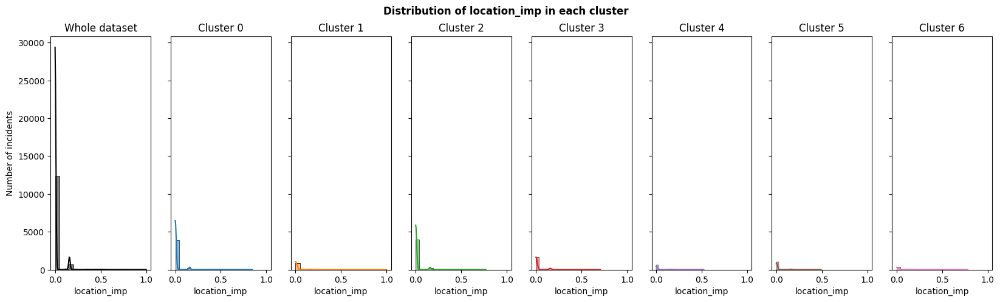

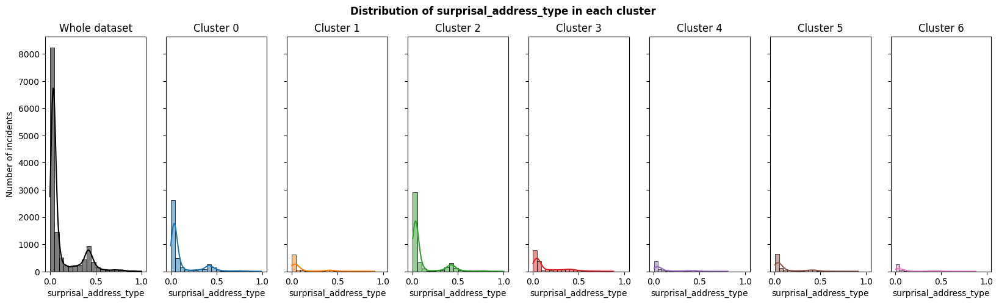

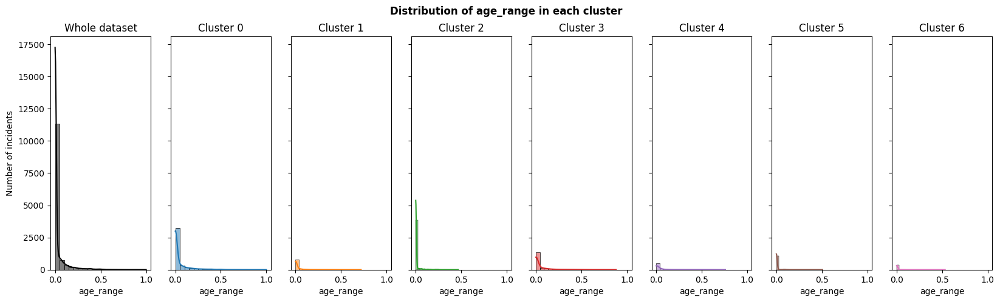

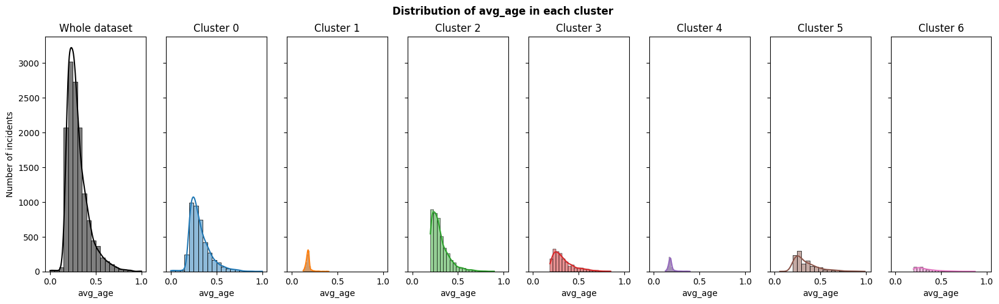

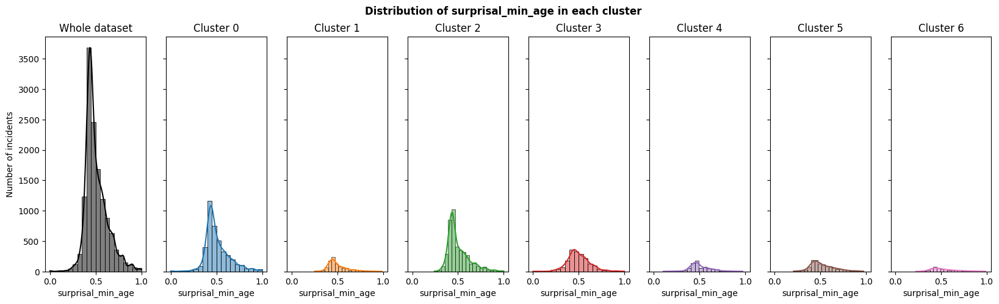

...

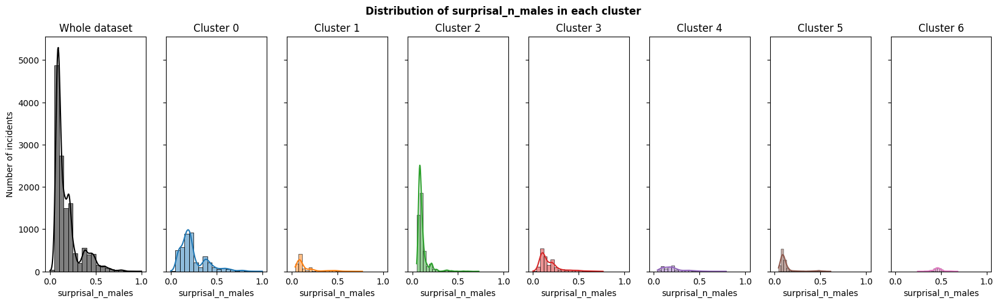

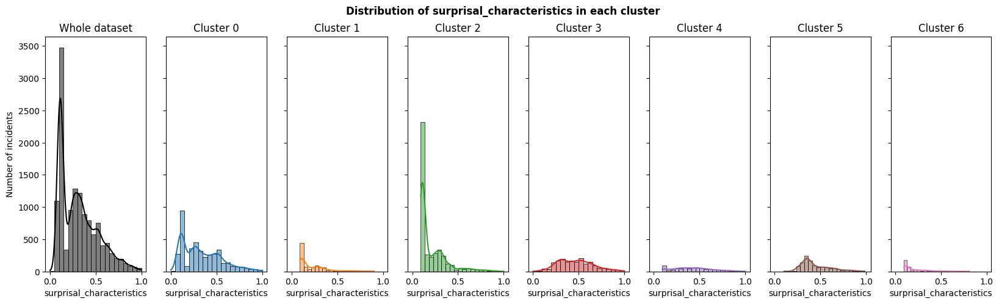

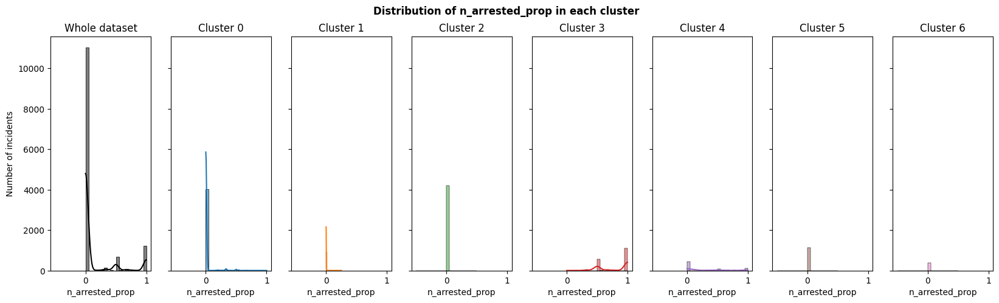

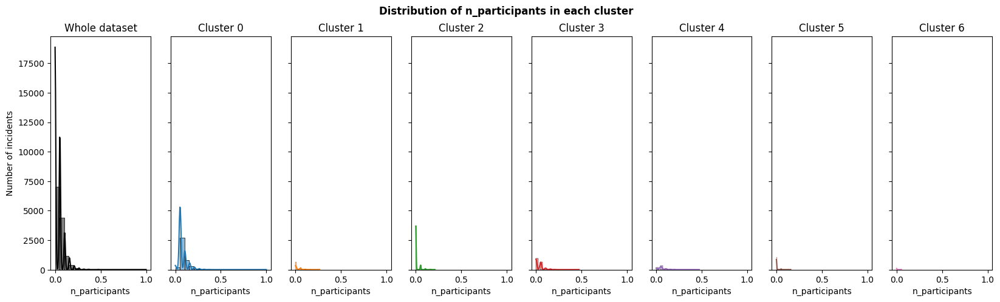

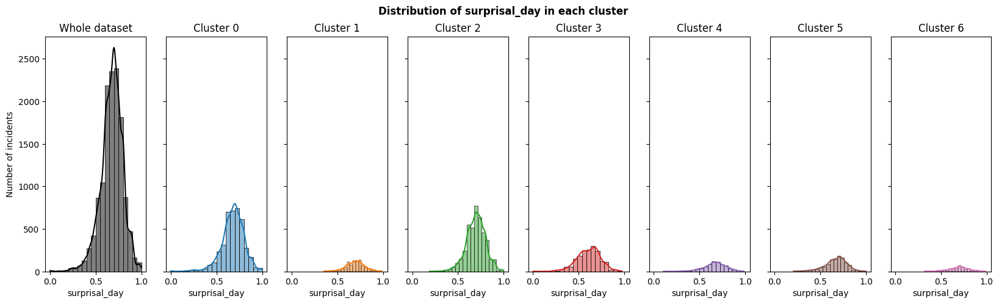

In [60]:
for feature in incidents_df.columns:
    plot_hists_by_cluster(
        df=incidents_df_cluster,
        feature=feature,
        cluster_column='ward',
        title=f'Distribution of {feature} in each cluster',
        color_palette=sns.color_palette(n_colors=int(results_df.loc['ward']['optimal n_clusters']) + 1)
    )

What we see it that information retived before are confermed, moreover we discover that when data is homogeneously distributed in the dataset, it will be the same on each cluster. Differences among groups arise when there are distributions with more than one local maximum (ex: n_arrested_prop); in these cases it may happen that clusters cover different and separated ranges of that data.

Now we analyze the clustering by looking at the feature of the original dataset. This can helps us identify the atributes that better separate each record

First of all, we select only the interesting features from the attributes where we want to check the clustering results.

In [61]:
features = ['latitude', 'longitude', 'county', 'city', 'location_importance', 'n_participants_child', 'n_participants_teen',
            'n_participants_adult', 'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed',
            'n_participants', 'poverty_perc']

numerical_features = ['latitude', 'longitude', 'location_importance', 'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                      'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants', 'poverty_perc']

incidents_df_full_state = incidents_df_full.loc[incidents_df_full['state'] == state][features] # get the records about only the chosen state
incidents_df_full_state.head()

,latitude,longitude,county,city,location_importance,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,poverty_perc
19,41.8895,-87.7507,Cook County,Chicago,1.000000e-05,0.0,1.0,2.0,3.0,0.0,1.0,2.0,0.0,0.0,3.0,10.9
21,41.7394,-87.6656,Cook County,Chicago,1.000000e-05,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,12.2
35,42.2704,-88.9703,Winnebago County,Rockford,1.000000e-07,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,1.0,2.0,NaN
58,41.9573,-87.7519,Cook County,Chicago,1.000000e-05,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,3.0,3.0,10.9
67,41.7613,-87.6483,Cook County,Chicago,1.000000e-05,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,11.3


We add, for each linkage we used, the columns relative to the cluster assigned to every record

In [62]:
# all the incidents not included in the analisys are dropped
incidents_df_full_state = incidents_df_full_state[incidents_df_full_state.index.isin(incidents_df_cluster.index)]

for algorithm in algorithms:
    incidents_df_full_state[algorithm] = incidents_df_cluster[algorithm]

incidents_df_full_state.head(2)

,latitude,longitude,county,city,location_importance,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,poverty_perc,single,complete,average,ward
19,41.8895,-87.7507,Cook County,Chicago,0.00001,0.0,1.0,2.0,3.0,0.0,1.0,2.0,0.0,0.0,3.0,10.9,0,0,0,0
21,41.7394,-87.6656,Cook County,Chicago,0.00001,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,12.2,0,1,0,1


We display a scatter plot for the attributes of the original dataset (again, only on "ward" results).
Here we can see if even other features are affected by the clustering.

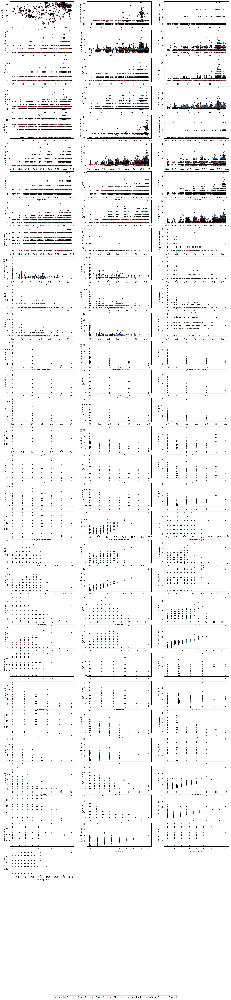

In [85]:
scatter_by_cluster(incidents_df_full_state,
                   numerical_features,
                   algorithms[3],
                   figsize=(20, 80),
                   color_palette=sns.color_palette(n_colors=clusters_info_df.loc[3]['n_clusters']))

Here we tell, for each cluster, which are the distinguishing attributes and their associated values:<br>

cluster 0: **n_hunarmed** > 1 & **n_partecipants_child** < 1 (and in general when there are different partecipants)

cluster 1: there are some points when **n_partecipants_teen** = 1

cluster 2: 0.1 < **location importance** < 0.2 and some points with high **longitude** and **latitude**

cluster 3: **n_arrested** > 1

cluster 4: **n_partecipants_teen** > 1

cluster 5: some points lies where **n_killed** is a little bit under its average

cluster 6: some points lie in **n_males** = 0 where **latitude** is above its average

As we expected, we can see that the attributes that better separate the clusters, are the ones used to built the indicators that better separate the cluster.

Again, we display, for each feature, a **boxplot** and a **violin plot** in order get information on data distribution and statistical insights about the attributes for each cluster.<br>

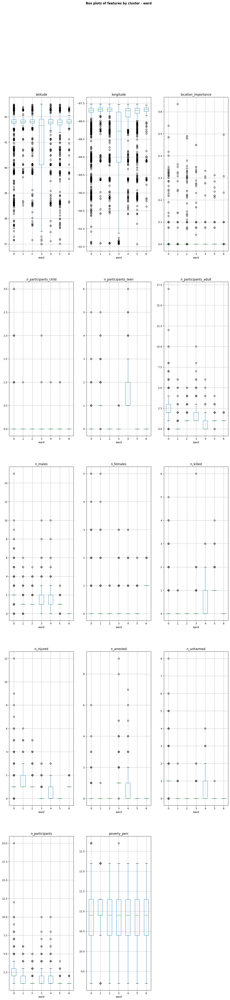

In [88]:
plot_boxes_by_cluster(incidents_df_full_state,
                    numerical_features,
                    algorithms[3],
                    figsize=(15, 65),
                    title=('Box plots of features by cluster - ward'))

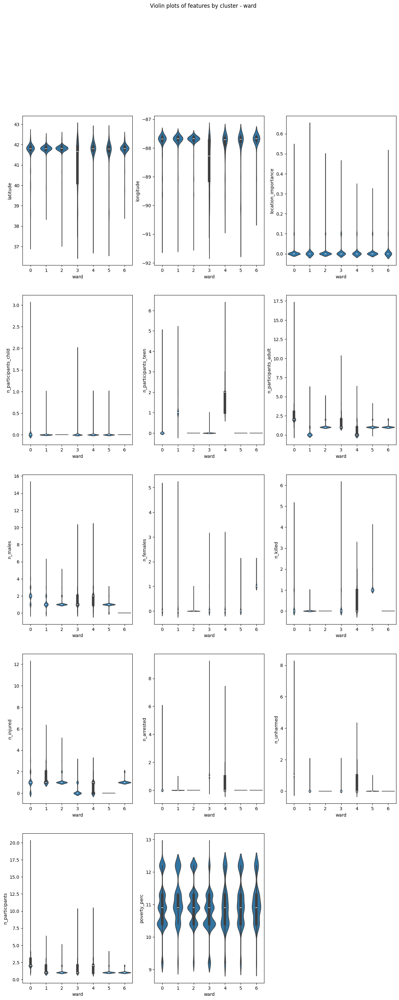

In [89]:
plot_violin_by_cluster(
    incidents_df_full_state,
    numerical_features,
    algorithms[3],
    figsize=(15, 35),
    title=('Violin plots of features by cluster - ward')
)

For each feature we can see the following behaviour:

- latitude and longitude: we always have the same distributions except for **cluster 3** where points are not accumulated around the median. There are very much point classified as outliers. most of the points are outliers, except for **cluster 4**.

- location_importance: all distributions have median 0 and points accumulated arount it

- n_participants_child: all the distributions have median 0 and most of the points are classified as outliers.

- n_participants_teen: all distributions mainly consists in outliers except for **cluster 4** which contains pints with value 1 and 2.

- n_participants_adult: we have different shaped distributions, but all of them fitted in lower values.

- n_males: the situation is very similar to *n_participants_adult*

- n_females: distributions mainly consist of outliers. For every cluster median is 0 except for **6** where it's 1.

- n_killed: all the distributions have points where the value is 0 (1 for **cluster 5**). Only **cluster 4** has values both from 0 and 1. All the records with other values are considered outliers

- n_injured: **clusters 0**, **1**, **2** and **6** contains mainly points with value 1, while **3** and **5** with value 0. Only **cluster 4** contains values from both 0 and 1 values. All the other record are classified as outliers. **Cluster 0** contains the incidents with value >= 6

- n_arrested: **clusters 0**, **1**, **2** , **5** and **6** contains mainly points with value 0, while **3** with value 1. Only **cluster 4** contains values from both 0 and 1 values. All the other record are classified as outliers.

- n_unharmed: **clusters 1**, **2**, **3**, **5** and **6** contains mainly points with value 1, while **0** with value 0. Only **cluster 4** contains values from both 0 and 1 values. All the other record are classified as outliers. **Cluster 0** contains the incidents with value >= 5

- n_participants: **cluster 2**, **5** and **6** contain distribution with median 0 and points accumulated around it. **Clusters 1**, **3**, **4** have values in distribution until 2, while **cluster 0** has a distribution whit mainly values 2 and 3.

- poverty_perc: we have very similar distributions for all the clusters.

From this we can see that **cluster 0** discriminates well the incidents with high *n_injured*, high *n_unharmed* and high *n_females*. *n_injured* in particular present different distributions for all the clusters and could be very useful for splitting the dataset.

At the end we check the distribution of the values in each cluster by histograms, including the distribution over all the dataset.

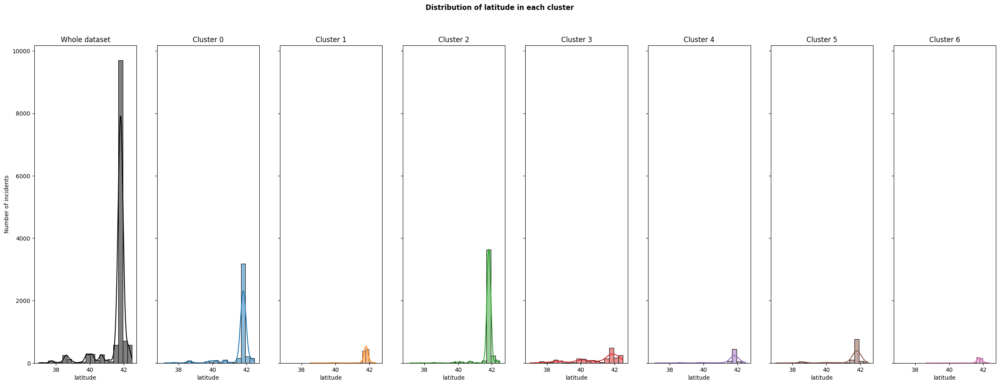

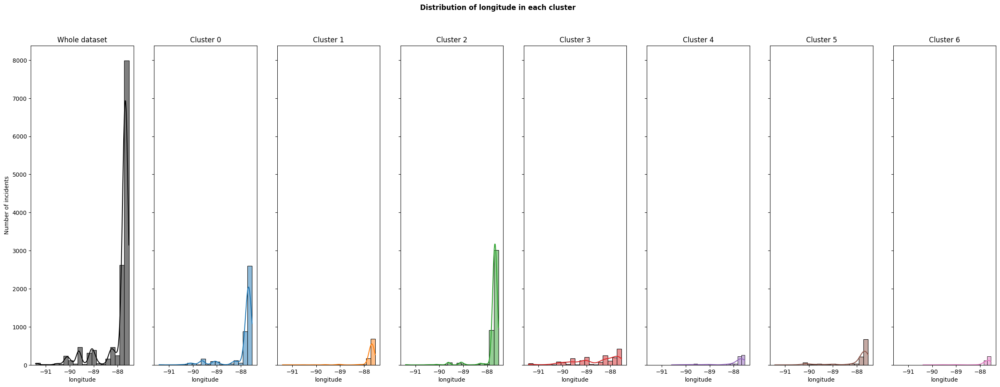

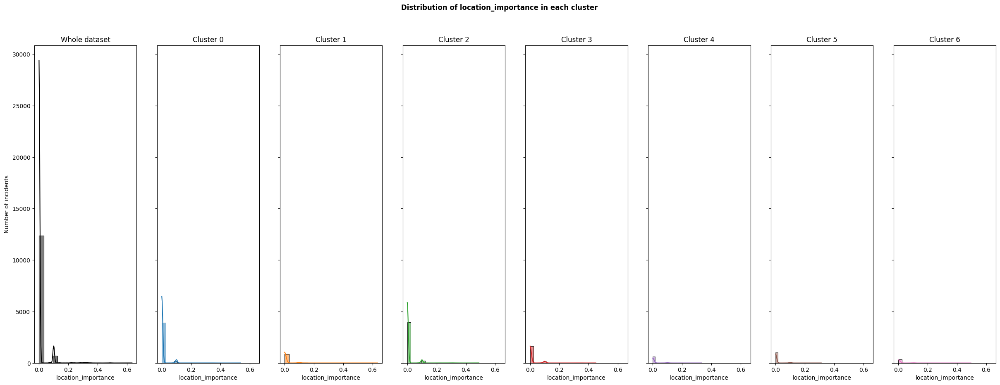

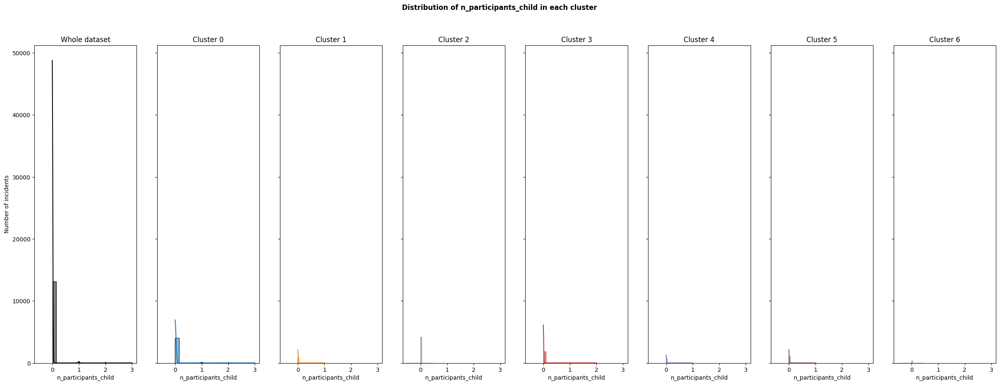

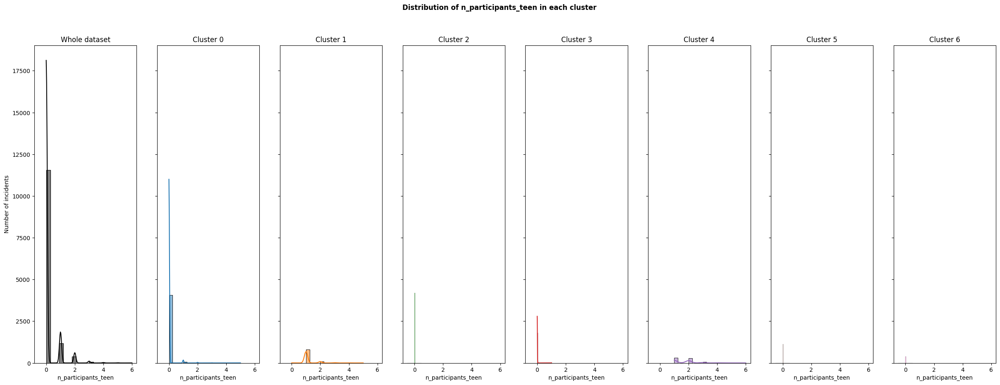

...

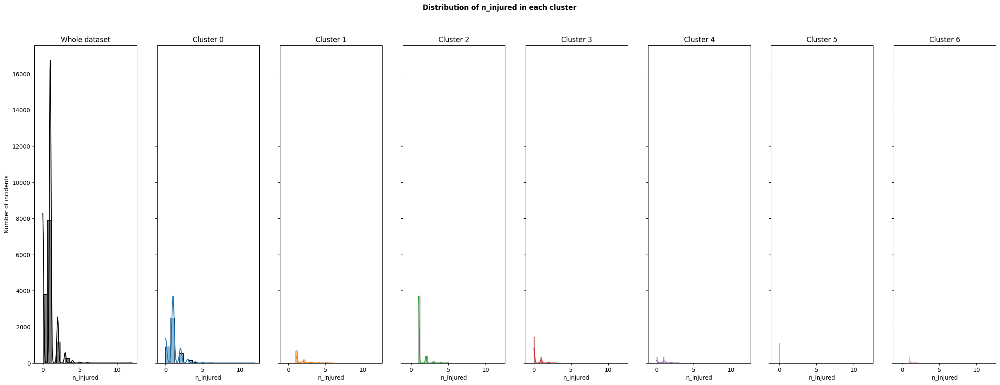

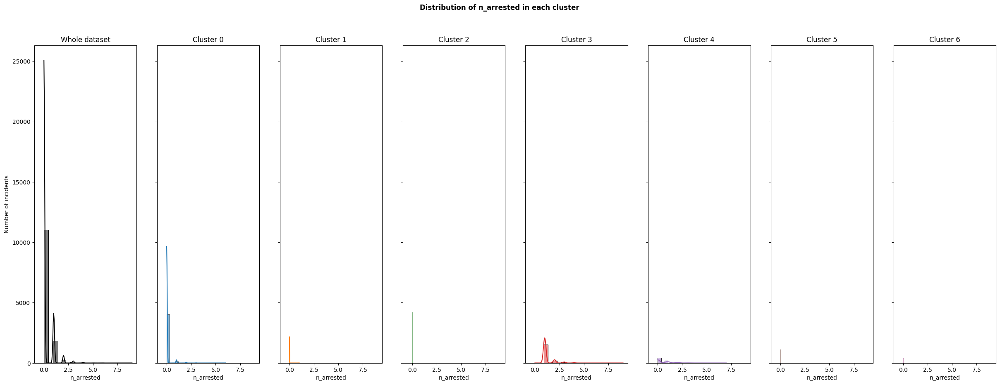

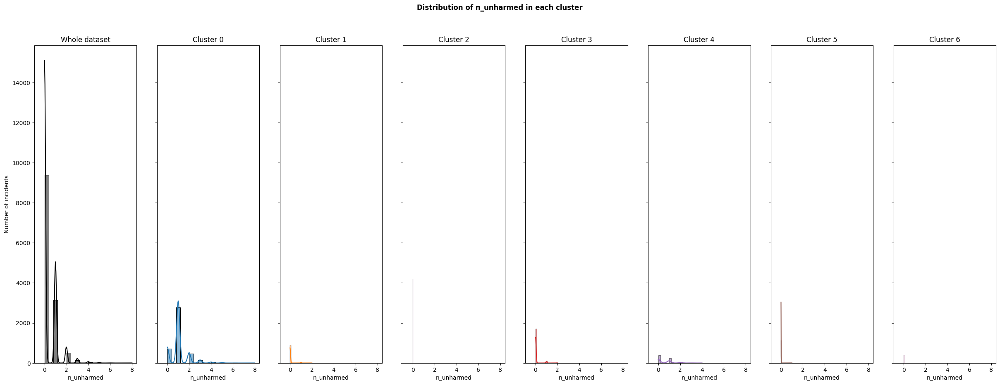

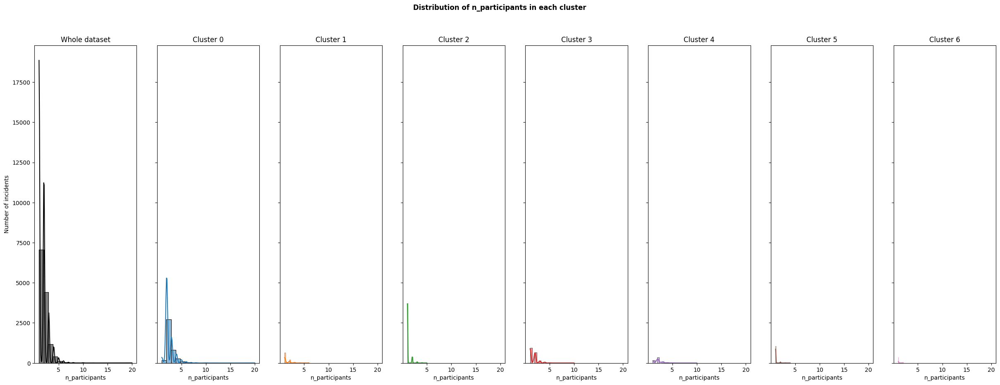

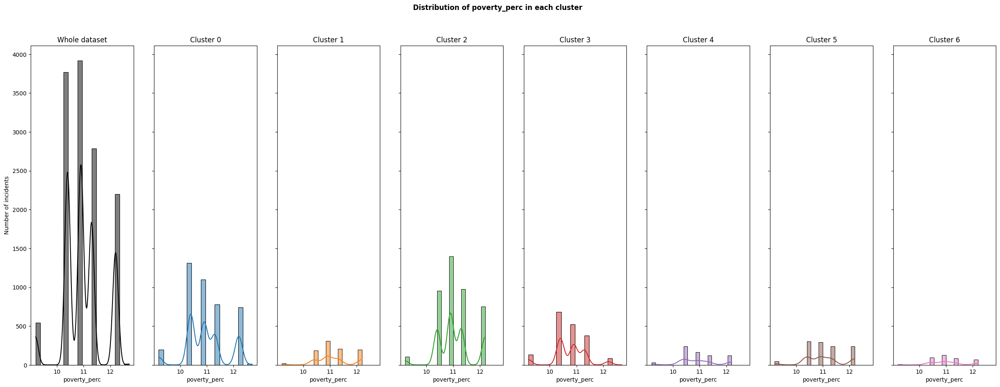

In [66]:
for feature in numerical_features:
    plot_hists_by_cluster(
        df=incidents_df_full_state,
        feature=feature,
        cluster_column='ward',
        figsize=(30, 10),
        title=f'Distribution of {feature} in each cluster',
        color_palette=sns.color_palette(n_colors=int(results_df.loc['ward']['optimal n_clusters']) + 1)
    )

We can observe the same behaviour as before, with the difference that here we have more fragmented and non-homogeneus distribuitions. So, what we can get, as in poverty_perc, is that the distribution of values in each cluster could be very different from the ones of the other groups and from the one over all the dataset.

## Conclusions
As we expected ward is the more stable and homogeneous algorithm between the four. In fact, we maximized the silhouette score without neither obtaining one huge cluster with almost all the records, neither lots of clusters where some have very tiny size. <br>

We are pretty satisfied with the similarity between points in each cluster, since the metrics show us that the intra distance of the points is quite small.<br>

Moreover we can tell that there are patterns from clustering based on indicators and the value of the original attributes of the dataset. In particular we saw that attribuites regarding the age, when refearing to non adults, are the most involved in some clustering characterization, while others could be described better by looking at the number of killed, injured or arrested people in the incident. More homogeneous, instead, are the distributions in each clusters of attributes regarding locality and other side information.
